# HAI DataSet Baseline Model

본 문서는 HAICon을 위한 베이스라인 모델을 제공합니다.

Recurrent neural network(RNN)을 이용했으며 구현 시 라이브러리는 PyTorch를 이용했습니다.

GPU가 1개 있다고 가정하고 코드가 작성되었습니다.
CPU로만 구동해보실 경우에는 모델과 batch feed 코드에서 .cuda()를 호출하지 않으시면 됩니다.

구현 편의성을 위해 전역 변수가 많이 사용되었습니다.
양해 바랍니다.
전역 변수는 모두 대문자로 명명했습니다.

In [1]:
import sys

from pathlib import Path
from datetime import timedelta

import dateutil
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import torch

from torch.utils.data import Dataset, DataLoader
from tqdm.notebook import trange
from TaPR_pkg import etapr

## 데이터 전처리

학습 데이터와 테스트 데이터는 CSV로 제공됩니다.
HAI 2.0은 단일 파일이 아니라 여러 파일로 제공되기 때문에 디렉토리 안에 있는 모든 CSV를 읽습니다.

In [2]:
TRAIN_DATASET = sorted([x for x in Path("../../HAICon2021_dataset/train/").glob("*.csv")])
TRAIN_DATASET

[PosixPath('../../HAICon2021_dataset/train/train1.csv'),
 PosixPath('../../HAICon2021_dataset/train/train2.csv'),
 PosixPath('../../HAICon2021_dataset/train/train3.csv'),
 PosixPath('../../HAICon2021_dataset/train/train4.csv'),
 PosixPath('../../HAICon2021_dataset/train/train5.csv'),
 PosixPath('../../HAICon2021_dataset/train/train6.csv')]

In [3]:
TEST_DATASET = sorted([x for x in Path("../../HAICon2021_dataset/test/").glob("*.csv")])
TEST_DATASET

[PosixPath('../../HAICon2021_dataset/test/test1.csv'),
 PosixPath('../../HAICon2021_dataset/test/test2.csv'),
 PosixPath('../../HAICon2021_dataset/test/test3.csv')]

In [4]:
VALIDATION_DATASET = sorted([x for x in Path("../../HAICon2021_dataset/validation/").glob("*.csv")])
VALIDATION_DATASET

[PosixPath('../../HAICon2021_dataset/validation/validation.csv')]

In [5]:
def dataframe_from_csv(target):
    return pd.read_csv(target).rename(columns=lambda x: x.strip())

def dataframe_from_csvs(targets):
    return pd.concat([dataframe_from_csv(x) for x in targets])

TRAIN_DF_RAW는 각각 학습 데이터를 하나의 Pandas Dataframe으로 로드한 결과입니다.
각 필드가 가지는 값의 범위는 크게 다릅니다.
정규화가 필요합니다.

In [6]:
TRAIN_DF_RAW = dataframe_from_csvs(TRAIN_DATASET)
TRAIN_DF_RAW

,timestamp,C01,C02,C03,C04,C05,C06,C07,C08,C09,...,C77,C78,C79,C80,C81,C82,C83,C84,C85,C86
0,2021-07-11 10:00:00,-2.2642,0,12.26196,-0.00087,12.01019,0.2254,12.66931,70,1,...,0.92255,30.08042,7.08818,595.06104,276.40338,1,1014.79321,12.0,50,3506
1,2021-07-11 10:00:01,-2.4923,0,12.26196,0.00058,12.56714,-0.0711,12.66931,70,1,...,0.92255,30.08423,7.08818,531.50317,276.18634,1,1014.79321,12.0,50,3493
2,2021-07-11 10:00:02,-2.8460,0,12.26196,-0.00072,14.48975,0.0051,12.66931,70,1,...,0.91873,30.09148,7.08818,451.06253,279.85754,1,1014.79321,12.0,50,3490
3,2021-07-11 10:00:03,-2.1235,0,12.26196,0.00101,15.93170,0.1842,12.66931,70,1,...,0.91644,30.10407,7.08818,404.38739,281.50317,1,1014.79321,12.0,50,3525
4,2021-07-11 10:00:04,-2.9074,0,12.26196,0.00043,16.10718,0.1842,12.66931,70,1,...,0.91797,30.10331,7.08818,382.53925,281.34039,1,1014.79321,12.0,50,3503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
259195,2021-08-09 08:59:56,-2.0065,0,12.26196,0.00051,100.28228,0.5977,12.53358,70,1,...,1.17355,35.05434,10.00000,3178.48877,370.02679,1,986.05908,12.0,50,136
259196,2021-08-09 08:59:57,-2.2101,0,12.26196,-0.00029,100.28228,0.5509,12.53358,70,1,...,1.16898,35.03488,10.00000,3175.36084,370.40656,1,986.05908,12.0,50,89
259197,2021-08-09 08:59:58,-2.3325,0,12.26196,0.00152,100.28228,0.5425,12.53358,70,1,...,1.16974,35.02840,10.00000,3175.73608,368.12787,1,986.05908,12.0,50,90
259198,2021-08-09 08:59:59,-2.3049,0,12.26196,0.00058,100.26703,0.6266,12.53358,70,1,...,1.16974,35.02420,10.00000,3176.61182,368.01941,1,986.05908,12.0,50,74


학습 데이터셋은 공격을 받지 않은 평상시 데이터이고 시간을 나타내는 필드인 time이 있으며, 나머지 필드는 모두 비식별화된 센서/액추에이터의 값입니다.
정규화는 센서/액추에이터 필드만을 대상으로 해야 합니다.

본 문서에서는 전체 데이터를 대상으로 이상을 탐지하므로 "attack" 필드만 사용하였습니다.

VALID_COLUMNS_IN_TRAIN_DATASET은 학습 데이터셋에 있는 모든 센서/액추에이터 필드를 담고 있습니다.
가끔 학습 데이터셋에 존재하지 않는 필드가 테스트 데이터셋에 존재하는 경우가 있습니다.
학습 시 보지 못했던 필드에 대해서 테스트를 할 수 없으므로 학습 데이터셋을 기준으로 필드 이름을 얻어냈습니다.

In [7]:
TRAIN_DF_RAW.head()

,timestamp,C01,C02,C03,C04,C05,C06,C07,C08,C09,...,C77,C78,C79,C80,C81,C82,C83,C84,C85,C86
0,2021-07-11 10:00:00,-2.2642,0,12.26196,-0.00087,12.01019,0.2254,12.66931,70,1,...,0.92255,30.08042,7.08818,595.06104,276.40338,1,1014.79321,12.0,50,3506
1,2021-07-11 10:00:01,-2.4923,0,12.26196,0.00058,12.56714,-0.0711,12.66931,70,1,...,0.92255,30.08423,7.08818,531.50317,276.18634,1,1014.79321,12.0,50,3493
2,2021-07-11 10:00:02,-2.8460,0,12.26196,-0.00072,14.48975,0.0051,12.66931,70,1,...,0.91873,30.09148,7.08818,451.06253,279.85754,1,1014.79321,12.0,50,3490
3,2021-07-11 10:00:03,-2.1235,0,12.26196,0.00101,15.93170,0.1842,12.66931,70,1,...,0.91644,30.10407,7.08818,404.38739,281.50317,1,1014.79321,12.0,50,3525
4,2021-07-11 10:00:04,-2.9074,0,12.26196,0.00043,16.10718,0.1842,12.66931,70,1,...,0.91797,30.10331,7.08818,382.53925,281.34039,1,1014.79321,12.0,50,3503


In [8]:
TIMESTAMP_FIELD = "timestamp"
IDSTAMP_FIELD = 'id'
ATTACK_FIELD = "attack"
VALID_COLUMNS_IN_TRAIN_DATASET = TRAIN_DF_RAW.columns.drop([TIMESTAMP_FIELD])
VALID_COLUMNS_IN_TRAIN_DATASET

Index(['C01', 'C02', 'C03', 'C04', 'C05', 'C06', 'C07', 'C08', 'C09', 'C10',
       'C11', 'C12', 'C13', 'C14', 'C15', 'C16', 'C17', 'C18', 'C19', 'C20',
       'C21', 'C22', 'C23', 'C24', 'C25', 'C26', 'C27', 'C28', 'C29', 'C30',
       'C31', 'C32', 'C33', 'C34', 'C35', 'C36', 'C37', 'C38', 'C39', 'C40',
       'C41', 'C42', 'C43', 'C44', 'C45', 'C46', 'C47', 'C48', 'C49', 'C50',
       'C51', 'C52', 'C53', 'C54', 'C55', 'C56', 'C57', 'C58', 'C59', 'C60',
       'C61', 'C62', 'C63', 'C64', 'C65', 'C66', 'C67', 'C68', 'C69', 'C70',
       'C71', 'C72', 'C73', 'C74', 'C75', 'C76', 'C77', 'C78', 'C79', 'C80',
       'C81', 'C82', 'C83', 'C84', 'C85', 'C86'],
      dtype='object')

TAG_MIN과 TAG_MAX는 학습 데이터셋에서 최솟값 최댓값을 얻은 결과입니다.

In [9]:
TAG_MIN = TRAIN_DF_RAW[VALID_COLUMNS_IN_TRAIN_DATASET].min()
TAG_MAX = TRAIN_DF_RAW[VALID_COLUMNS_IN_TRAIN_DATASET].max()

print(f'TAG_MIN : \n{TAG_MIN}')
print('----------------')
print(f'TAG_MAX : \n{TAG_MAX}')

TAG_MIN : 
C01     -4.62710
C02      0.00000
C03     11.98730
C04     -0.04253
C05      0.26855
         ...    
C82      1.00000
C83    890.04523
C84     12.00000
C85     50.00000
C86   -112.00000
Length: 86, dtype: float64
----------------
TAG_MAX : 
C01        0.82860
C02        0.00000
C03       16.86249
C04        0.04051
C05      100.87737
          ...     
C82        1.00000
C83     1121.85547
C84       17.14934
C85       50.00000
C86    12993.00000
Length: 86, dtype: float64


normalize 함수는 Dataframe을 정규화합니다.
정규화 방법은 최솟값, 최댓값을 이용하여 0~1의 범위에 들어오도록 하는 것입니다.

가끔 값이 전혀 변하지 않는 필드가 있습니다.
이 경우 최솟값과 최댓값이 같을 것입니다.
본 문서에서는 이런 필드를 모두 0으로 만들었습니다.

In [10]:
def normalize(df):
    ndf = df.copy()
    for c in df.columns:
        if TAG_MIN[c] == TAG_MAX[c]:
            ndf[c] = df[c] - TAG_MIN[c]
        else:
            ndf[c] = (df[c] - TAG_MIN[c]) / (TAG_MAX[c] - TAG_MIN[c])
    return ndf

TRAIN_DF는 정규화를 마친 후 exponential weighted function을 통과시킨 결과입니다.
센서에서 발생하는 noise를 smoothing 시켜주기를 기대하고 적용했습니다.

In [11]:
TRAIN_DF = normalize(TRAIN_DF_RAW[VALID_COLUMNS_IN_TRAIN_DATASET]).ewm(alpha=0.9).mean()
TRAIN_DF

,C01,C02,C03,C04,C05,C06,C07,C08,C09,C10,...,C77,C78,C79,C80,C81,C82,C83,C84,C85,C86
0,0.433107,0.0,0.056338,0.501686,0.116706,0.447955,0.816071,0.0,0.0,0.0,...,0.240561,0.194185,0.708818,0.183693,0.169066,0.0,0.538147,0.0,0.0,0.276078
1,0.395098,0.0,0.056338,0.517560,0.121738,0.397053,0.816071,0.0,0.0,0.0,...,0.240561,0.194535,0.708818,0.165517,0.168332,0.0,0.538147,0.0,0.0,0.275176
2,0.333267,0.0,0.056338,0.504886,0.139408,0.405431,0.816071,0.0,0.0,0.0,...,0.238319,0.195226,0.708818,0.141083,0.180570,0.0,0.538147,0.0,0.0,0.274889
3,0.446345,0.0,0.056338,0.522383,0.154058,0.436703,0.816071,0.0,0.0,0.0,...,0.236754,0.196440,0.708818,0.125447,0.187292,0.0,0.538147,0.0,0.0,0.277264
4,0.328324,0.0,0.056338,0.517845,0.157091,0.439827,0.816071,0.0,0.0,0.0,...,0.237495,0.196492,0.708818,0.117700,0.187419,0.0,0.538147,0.0,0.0,0.275990
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
259195,0.485034,0.0,0.056340,0.515751,0.994085,0.520004,0.640361,0.0,0.0,0.0,...,0.403941,0.696846,1.000000,0.996289,0.517805,0.0,0.414192,0.0,0.0,0.018717
259196,0.447224,0.0,0.056338,0.509379,0.994085,0.510481,0.640361,0.0,0.0,0.0,...,0.401381,0.695028,1.000000,0.995484,0.518674,0.0,0.414192,0.0,0.0,0.015676
259197,0.423251,0.0,0.056338,0.528358,0.994085,0.508101,0.640361,0.0,0.0,0.0,...,0.401571,0.694256,1.000000,0.995510,0.511131,0.0,0.414192,0.0,0.0,0.015440
259198,0.425407,0.0,0.056338,0.520068,0.993949,0.522157,0.640361,0.0,0.0,0.0,...,0.401590,0.693797,1.000000,0.995761,0.510014,0.0,0.414192,0.0,0.0,0.014318


boundary_check 함수는 Pandas Dataframe에 있는 값 중 1 초과의 값이 있는지, 0 미만의 값이 있는지, NaN이 있는지 점검합니다.

In [12]:
def boundary_check(df):
    x = np.array(df, dtype=np.float32)
    return np.any(x > 1.0), np.any(x < 0), np.any(np.isnan(x))

In [13]:
boundary_check(TRAIN_DF)

(False, False, False)

1보다 큰 값, 0보다 작은 값, not a number가 없습니다. 정규화가 정상적으로 처리되었습니다.

## 시각화

In [14]:
TRAIN_DF.columns

Index(['C01', 'C02', 'C03', 'C04', 'C05', 'C06', 'C07', 'C08', 'C09', 'C10',
       'C11', 'C12', 'C13', 'C14', 'C15', 'C16', 'C17', 'C18', 'C19', 'C20',
       'C21', 'C22', 'C23', 'C24', 'C25', 'C26', 'C27', 'C28', 'C29', 'C30',
       'C31', 'C32', 'C33', 'C34', 'C35', 'C36', 'C37', 'C38', 'C39', 'C40',
       'C41', 'C42', 'C43', 'C44', 'C45', 'C46', 'C47', 'C48', 'C49', 'C50',
       'C51', 'C52', 'C53', 'C54', 'C55', 'C56', 'C57', 'C58', 'C59', 'C60',
       'C61', 'C62', 'C63', 'C64', 'C65', 'C66', 'C67', 'C68', 'C69', 'C70',
       'C71', 'C72', 'C73', 'C74', 'C75', 'C76', 'C77', 'C78', 'C79', 'C80',
       'C81', 'C82', 'C83', 'C84', 'C85', 'C86'],
      dtype='object')

In [15]:
TRAIN_DF['C01']

0         0.433107
1         0.395098
2         0.333267
3         0.446345
4         0.328324
            ...   
259195    0.485034
259196    0.447224
259197    0.423251
259198    0.425407
259199    0.442746
Name: C01, Length: 1004402, dtype: float64

In [16]:
TRAIN_DF_RAW['timestamp']

0         2021-07-11 10:00:00
1         2021-07-11 10:00:01
2         2021-07-11 10:00:02
3         2021-07-11 10:00:03
4         2021-07-11 10:00:04
                 ...         
259195    2021-08-09 08:59:56
259196    2021-08-09 08:59:57
259197    2021-08-09 08:59:58
259198    2021-08-09 08:59:59
259199    2021-08-09 09:00:00
Name: timestamp, Length: 1004402, dtype: object

In [17]:
# import matplotlib.pyplot as plt

# for col in list(TRAIN_DF.columns):
#     plt.rcParams['figure.figsize'] = [10, 5]
#     plt.plot(range(len(TRAIN_DF_RAW['timestamp'])), TRAIN_DF[col])
#     plt.savefig(f'./plot_cols/{col}.png')
#     plt.clf()

## 신규 모델 학습
using auto arima

In [18]:
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX 
from pmdarima.arima import auto_arima
import math


In [19]:
model_dict = {}

In [20]:
colnames = TRAIN_DF.columns
print(colnames)
print()
print(TRAIN_DF.head())

Index(['C01', 'C02', 'C03', 'C04', 'C05', 'C06', 'C07', 'C08', 'C09', 'C10',
       'C11', 'C12', 'C13', 'C14', 'C15', 'C16', 'C17', 'C18', 'C19', 'C20',
       'C21', 'C22', 'C23', 'C24', 'C25', 'C26', 'C27', 'C28', 'C29', 'C30',
       'C31', 'C32', 'C33', 'C34', 'C35', 'C36', 'C37', 'C38', 'C39', 'C40',
       'C41', 'C42', 'C43', 'C44', 'C45', 'C46', 'C47', 'C48', 'C49', 'C50',
       'C51', 'C52', 'C53', 'C54', 'C55', 'C56', 'C57', 'C58', 'C59', 'C60',
       'C61', 'C62', 'C63', 'C64', 'C65', 'C66', 'C67', 'C68', 'C69', 'C70',
       'C71', 'C72', 'C73', 'C74', 'C75', 'C76', 'C77', 'C78', 'C79', 'C80',
       'C81', 'C82', 'C83', 'C84', 'C85', 'C86'],
      dtype='object')

        C01  C02       C03       C04       C05       C06       C07  C08  C09  \
0  0.433107  0.0  0.056338  0.501686  0.116706  0.447955  0.816071  0.0  0.0   
1  0.395098  0.0  0.056338  0.517560  0.121738  0.397053  0.816071  0.0  0.0   
2  0.333267  0.0  0.056338  0.504886  0.139408  0.405431  0.816071  0.0

In [21]:
import pickle
import os

path = "./time_models/"

for col in colnames:
    print(f'Searching {col}')
    
    # update file list
    file_lst = str(os.listdir(path))
    
    if col in file_lst: 
        print(f'{col} model already exists!')
        continue
    
    else:    
        # Parameter search 
        print(f'Training {col}')
        arima = auto_arima(TRAIN_DF[col], 
                          start_p=0, max_p=2, 
                          start_q=0, max_q=2,
                          seasonal=False,
                          d = 0,
                          trace=True,
                          error_action='ignore',  
                          suppress_warnings=True, 
                          stepwise=False)

        # Serialize with Pickle
        print(f'Saving {col}')
        with open(f'./time_models/{col}_arima.pkl', 'wb') as pkl:
            pickle.dump(arima, pkl)


Searching C01
C01 model already exists!
Searching C02
C02 model already exists!
Searching C03
C03 model already exists!
Searching C04
C04 model already exists!
Searching C05
C05 model already exists!
Searching C06
C06 model already exists!
Searching C07
C07 model already exists!
Searching C08
C08 model already exists!
Searching C09
C09 model already exists!
Searching C10
C10 model already exists!
Searching C11
C11 model already exists!
Searching C12
C12 model already exists!
Searching C13
C13 model already exists!
Searching C14
C14 model already exists!
Searching C15
C15 model already exists!
Searching C16
C16 model already exists!
Searching C17
C17 model already exists!
Searching C18
C18 model already exists!
Searching C19
C19 model already exists!
Searching C20
C20 model already exists!
Searching C21
C21 model already exists!
Searching C22
C22 model already exists!
Searching C23
C23 model already exists!
Searching C24
C24 model already exists!
Searching C25
C25 model already exists!


## 학습된 모델을 이용한 탐지

검증 데이터셋을 불러와서 모델에 입력으로 주고 예측값과 실제값의 차를 얻어봅니다.

In [22]:
VALIDATION_DF_RAW = dataframe_from_csvs(VALIDATION_DATASET)
VALIDATION_DF = normalize(VALIDATION_DF_RAW[VALID_COLUMNS_IN_TRAIN_DATASET]).ewm(alpha=0.9).mean()
print(VALIDATION_DF.shape)
VAL_LEN =VALIDATION_DF.shape[0]
VAL_LEN

(86400, 86)


86400

In [23]:
TEST_DF_RAW = dataframe_from_csvs(TEST_DATASET)
TEST_DF = normalize(TEST_DF_RAW[VALID_COLUMNS_IN_TRAIN_DATASET]).ewm(alpha=0.9).mean()
print(TEST_DF.shape)
TEST_LEN =TEST_DF.shape[0]
TEST_LEN

(274800, 86)


274800

In [24]:
val_pred = {}
test_pred = {}

In [25]:
result = [val_pred, test_pred]
result 

[{}, {}]

In [26]:
list(range(2))

[0, 1]

In [35]:
for dictType in list(range(2)):
    for col in colnames:
        # Now read it back and make a prediction
        if dictType == 0:
            # validation prediction
            with open(f'./time_models/{col}_arima.pkl', 'rb') as pkl:
                pickle_preds = pickle.load(pkl).predict(n_periods=VAL_LEN)
                val_pred[col] = list(pickle_preds)
        elif dictType == 1:
            # validation prediction
            with open(f'./time_models/{col}_arima.pkl', 'rb') as pkl:
                pickle_preds = pickle.load(pkl).predict(n_periods=TEST_LEN)
                test_pred[col] = list(pickle_preds)

## 여기까지!!!!!!!!

In [36]:
# 출력 값 저장
with open(f'./time_models/val_pred.pkl', 'wb') as pkl:
    pickle.dump(val_pred, pkl)
    
with open(f'./time_models/test_pred.pkl', 'wb') as pkl:
    pickle.dump(test_pred, pkl)

### Attack 위치 파악

In [37]:
VALIDATION_DF_RAW.head()

,timestamp,C01,C02,C03,C04,C05,C06,C07,C08,C09,...,C78,C79,C80,C81,C82,C83,C84,C85,C86,attack
0,2021-07-10 00:00:01,-2.0395,0,11.78894,0.00058,16.32080,0.4010,12.903438,70,1,...,31.52100,0.716042,386.51172,356.64423,1,1034.712769,12.0,50,161,0
1,2021-07-10 00:00:02,-2.1750,0,11.78894,-0.00282,15.95459,0.4187,12.903438,70,1,...,31.51756,0.716042,411.33905,352.08698,1,1034.712769,12.0,50,155,0
2,2021-07-10 00:00:03,-2.5854,0,11.78131,-0.00398,14.79492,0.0691,12.903438,70,1,...,31.50269,0.716042,438.15259,347.63818,1,1034.712769,12.0,50,149,0
3,2021-07-10 00:00:04,-2.4722,0,11.78894,-0.00152,14.72626,0.3306,12.903438,70,1,...,31.47942,0.716042,465.95908,340.33203,1,1034.712769,12.0,50,148,0
4,2021-07-10 00:00:05,-2.2319,0,11.78131,0.00072,14.78729,0.2150,12.903438,70,1,...,31.47942,0.716042,452.05582,335.17798,1,1034.712769,12.0,50,148,0


In [38]:
val_pred

{'C01': [0.4698473028185346,
  0.4814056140436542,
  0.4826946375317625,
  0.48401735476741425,
  0.4834369548599289,
  0.4834005598776373,
  0.4828599218992071,
  0.48256237910096145,
  0.48210356191431214,
  0.481735491740624,
  0.48131242199544305,
  0.48092199011277137,
  0.48051256777577095,
  0.4801148969867518,
  0.4797107743812753,
  0.479311009852788,
  0.4789091932365934,
  0.4785091280618309,
  0.4781085577138793,
  0.4777088206161133,
  0.47730912231577294,
  0.47690993369687473,
  0.4765109749584373,
  0.47611241165200546,
  0.4757141451172857,
  0.47531623344148366,
  0.4749186417194888,
  0.4745213902155215,
  0.4741244664641977,
  0.47372787741779343,
  0.4733316185091588,
  0.47293569200557295,
  0.4725400961200652,
  0.4721448314712744,
  0.4717498972510475,
  0.4713552934980645,
  0.4709610197489786,
  0.47056707583864577,
  0.4701734614253771,
  0.4697801762725892,
  0.46938722008171085,
  0.46899459259131304,
  0.4686022935182984,
  0.46821032259279133,
  0.4678186

In [39]:
val_true = {}
for col in VALIDATION_DF.columns:
    val_true[col]=list(VALIDATION_DF[col])
val_true

{'C01': [0.4742929413274191,
  0.4517143871213927,
  0.38191084388639246,
  0.393675516900078,
  0.4344923252007599,
  0.345929119028813,
  0.46051626958664543,
  0.3261128459896511,
  0.45388261562836074,
  0.3560670012198252,
  0.415009893113389,
  0.4101979484549821,
  0.3682775252925495,
  0.45430488653589113,
  0.33121599738757374,
  0.46033167360645544,
  0.3346230824952755,
  0.43693390676117605,
  0.3817893270362548,
  0.3897195232786204,
  0.43818745171382545,
  0.3445170973535041,
  0.4612493708970713,
  0.47292259825142796,
  0.4657921773426017,
  0.35778584566468163,
  0.4170623794965414,
  0.42299003287972736,
  0.3742912315996469,
  0.44954489198889597,
  0.4570702580278209,
  0.47316454729406654,
  0.3352300130262339,
  0.4389576842947235,
  0.3805400120645697,
  0.39373521534946343,
  0.4373682793112171,
  0.3431979419953116,
  0.46182680521553277,
  0.32814099934406926,
  0.44936742947965325,
  0.35860135060601117,
  0.4117330752882531,
  0.4150171772430692,
  0.365922

In [43]:
val_true['C01'][0]-val_pred['C01'][0]

0.00444563850888452

In [44]:
len(val_true['C01']) == len(val_pred['C01'])

True

In [54]:
np.mean(val_pred['C01'])

0.006715666296441883

In [73]:
val_dist = {}
for col in VALIDATION_DF.columns:
    val_dist[col]=[abs(val_true[col][x]-val_pred[col][x]) for x in range(len(val_true[col]))]
val_dist

{'C01': [0.00444563850888452,
  0.02969122692226145,
  0.10078379364537005,
  0.09034183786733624,
  0.04894462965916896,
  0.1374714408488243,
  0.02234365231256169,
  0.15644953311131032,
  0.028220946285951398,
  0.12566849052079881,
  0.06630252888205407,
  0.07072404165778928,
  0.11223504248322147,
  0.025810010450860676,
  0.14849477699370156,
  0.01897933624633258,
  0.14428611074131792,
  0.04157522130065483,
  0.09631923067762449,
  0.08798929733749289,
  0.03912167060194749,
  0.13239283634337062,
  0.015261604061366008,
  0.0031898134005775014,
  0.009921967774684015,
  0.11753038777680203,
  0.057856262222947374,
  0.051531357335794115,
  0.09983323486455081,
  0.024182985428897463,
  0.01626136048133786,
  0.00022885528849359016,
  0.1373100830938313,
  0.03318714717655091,
  0.09120988518647777,
  0.07762007814860106,
  0.033592740437761504,
  0.12736913384333415,
  0.008346656209844316,
  0.14163917692851996,
  0.020019790602057608,
  0.11039324198530187,
  0.0568692182

In [82]:
val_score = np.mean(np.array(pd.DataFrame(val_dist)), axis=1)

In [83]:
val_score

array([0.16543065, 0.17110006, 0.17201644, ..., 0.25395203, 0.25326836,
       0.25338681])

In [84]:
val_score.shape

(86400,)

In [86]:
val_attack = np.array(VALIDATION_DF_RAW['attack'])
val_attack

array([0, 0, 0, ..., 0, 0, 0])

In [87]:
val_attack.shape

(86400,)

In [67]:
from collections import Counter

Counter(val_attack)

Counter({0: 85515, 1: 885})

In [88]:
def check_graph(xs, att, piece=2, THRESHOLD=None):
    l = xs.shape[0]
    chunk = l // piece
    fig, axs = plt.subplots(piece, figsize=(20, 4 * piece))
    for i in range(piece):
        L = i * chunk
        R = min(L + chunk, l)
        xticks = range(L, R)
        axs[i].plot(xticks, xs[L:R])
        if len(xs[L:R]) > 0:
            peak = max(xs[L:R])
            axs[i].plot(xticks, att[L:R] * peak * 0.3)
        if THRESHOLD!=None:
            axs[i].axhline(y=THRESHOLD, color='r')
    plt.show()

In [90]:
def put_labels(distance, threshold):
    xs = np.zeros_like(distance)
    xs[distance > threshold] = 1
    return xs

In [97]:
import numpy as np

best_thres = 0
best_f1 = 0

for THRESHOLD in list(np.around(np.arange(0.020, 0.4, 0.001),3)):
    print(f'----------THRESHOLD : {THRESHOLD}----------')
    #val_score
    LABELS = put_labels(val_score, THRESHOLD)
    print('>>> LABELS')
    print(LABELS, LABELS.shape)
    FINAL_LABELS = LABELS
    #FINAL_LABELS = fill_blank(CHECK_TS, LABELS, np.array(VALIDATION_DF_RAW[TIMESTAMP_FIELD]))
    print('>>> FINAL_LABELS')
    print(FINAL_LABELS, FINAL_LABELS.shape)
    
    if val_attack.shape[0] == FINAL_LABELS.shape[0]:
        #val_score - val_attack
        TaPR = etapr.evaluate_haicon(anomalies=val_attack, predictions=FINAL_LABELS)
        print(f">>> F1: {TaPR['f1']:.3f} (TaP: {TaPR['TaP']:.3f}, TaR: {TaPR['TaR']:.3f})")
        print(f">>> # of detected anomalies: {len(TaPR['Detected_Anomalies'])}")
        print(f">>> Detected anomalies: {TaPR['Detected_Anomalies']}")
        
        if TaPR['f1']>=best_f1:
              best_thres = THRESHOLD
              best_f1 = TaPR['f1']
              print("***Best Threshold updated!!***")

----------THRESHOLD : 0.02----------
>>> LABELS
[1. 1. 1. ... 1. 1. 1.] (86400,)
>>> FINAL_LABELS
[1. 1. 1. ... 1. 1. 1.] (86400,)
>>> F1: 0.000 (TaP: 0.000, TaR: 0.000)
>>> # of detected anomalies: 0
>>> Detected anomalies: []
***Best Threshold updated!!***
----------THRESHOLD : 0.021----------
>>> LABELS
[1. 1. 1. ... 1. 1. 1.] (86400,)
>>> FINAL_LABELS
[1. 1. 1. ... 1. 1. 1.] (86400,)
>>> F1: 0.000 (TaP: 0.000, TaR: 0.000)
>>> # of detected anomalies: 0
>>> Detected anomalies: []
***Best Threshold updated!!***
----------THRESHOLD : 0.022----------
>>> LABELS
[1. 1. 1. ... 1. 1. 1.] (86400,)
>>> FINAL_LABELS
[1. 1. 1. ... 1. 1. 1.] (86400,)
>>> F1: 0.000 (TaP: 0.000, TaR: 0.000)
>>> # of detected anomalies: 0
>>> Detected anomalies: []
***Best Threshold updated!!***
----------THRESHOLD : 0.023----------
>>> LABELS
[1. 1. 1. ... 1. 1. 1.] (86400,)
>>> FINAL_LABELS
[1. 1. 1. ... 1. 1. 1.] (86400,)
>>> F1: 0.000 (TaP: 0.000, TaR: 0.000)
>>> # of detected anomalies: 0
>>> Detected anomal

In [98]:
best_thres

0.233

In [99]:
best_f1

0.02107047671565134

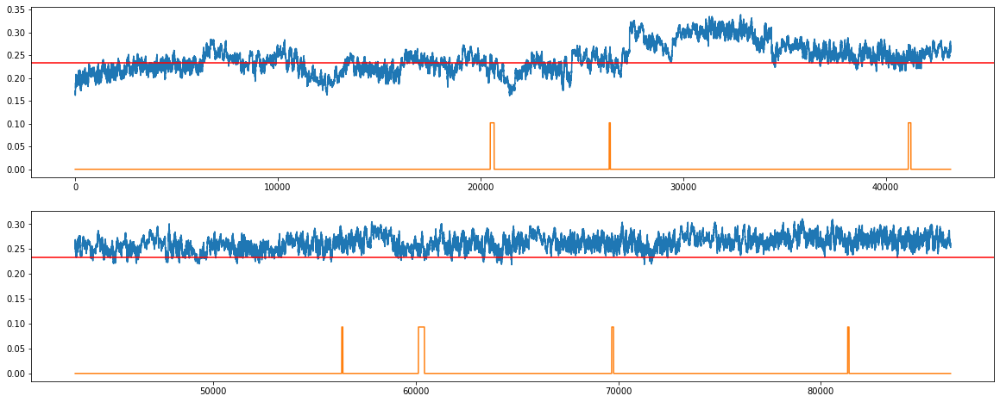

In [100]:
THRESHOLD = best_thres
check_graph(np.array(val_score), np.array(val_attack), piece=2, THRESHOLD=THRESHOLD)

In [30]:
TEST_DF_RAW.head()

,timestamp,C01,C02,C03,C04,C05,C06,C07,C08,C09,...,C77,C78,C79,C80,C81,C82,C83,C84,C85,C86
0,2021-07-13 16:00:01,-2.1424,0,12.3764,-0.00275,8.02002,0.1524,12.58874,70,1,...,1.13464,29.09910,2.85153,227.61664,333.51416,1,981.36951,12.0,50,2100
1,2021-07-13 16:00:02,-2.0449,0,12.3764,-0.00087,8.02002,0.1281,12.58874,70,1,...,1.13312,29.14869,2.85153,231.58908,340.18738,1,981.36951,12.0,50,2165
2,2021-07-13 16:00:03,-2.1287,0,12.3764,-0.00260,8.02002,0.0148,12.58874,70,1,...,1.13388,29.18836,2.85153,229.60286,347.14990,1,981.36951,12.0,50,2209
3,2021-07-13 16:00:04,-2.1287,0,12.3764,-0.00282,8.02002,0.0148,12.58874,70,1,...,1.13541,29.24558,2.85153,229.60286,355.90277,1,981.36951,12.0,50,2233
4,2021-07-13 16:00:05,-2.5969,0,12.3764,0.00058,8.02002,-0.2225,12.58874,70,1,...,1.13541,29.24558,2.85153,222.65125,358.23566,1,981.36951,12.0,50,2290


In [101]:
test_true = {}
for col in TEST_DF.columns:
    test_true[col]=list(TEST_DF[col])
test_true

{'C01': [0.45543193357406025,
  0.4716784947186179,
  0.45930423705961226,
  0.45807906303396806,
  0.38071924297518905,
  0.3313467983996056,
  0.3053270631829621,
  0.3038963443339394,
  0.317824794005216,
  0.35621930694253223,
  0.40072265104222476,
  0.44356036012415284,
  0.46922360571016514,
  0.4665770336652115,
  0.43818582991306887,
  0.3913670185724422,
  0.3465821259091533,
  0.31257488689485435,
  0.3006289717255762,
  0.3139843004755252,
  0.3504079063750633,
  0.3956379642357614,
  0.4365027776725452,
  0.46460817501233775,
  0.46728674268040427,
  0.4395930179819544,
  0.4368236455121094,
  0.35361876134722253,
  0.31136495548292703,
  0.3027020141801824,
  0.3018357200499079,
  0.3388167446501143,
  0.3840695513644011,
  0.42751009497184167,
  0.4318541493325857,
  0.4670466976284215,
  0.4532776118234394,
  0.4107584116946522,
  0.36732728461393627,
  0.32825902206258145,
  0.30416046972280053,
  0.3055613078920521,
  0.3274767825845753,
  0.3605168004609247,
  0.4038

In [102]:
test_pred

{'C01': [0.4698473028185346,
  0.4814056140436542,
  0.4826946375317625,
  0.48401735476741425,
  0.4834369548599289,
  0.4834005598776373,
  0.4828599218992071,
  0.48256237910096145,
  0.48210356191431214,
  0.481735491740624,
  0.48131242199544305,
  0.48092199011277137,
  0.48051256777577095,
  0.4801148969867518,
  0.4797107743812753,
  0.479311009852788,
  0.4789091932365934,
  0.4785091280618309,
  0.4781085577138793,
  0.4777088206161133,
  0.47730912231577294,
  0.47690993369687473,
  0.4765109749584373,
  0.47611241165200546,
  0.4757141451172857,
  0.47531623344148366,
  0.4749186417194888,
  0.4745213902155215,
  0.4741244664641977,
  0.47372787741779343,
  0.4733316185091588,
  0.47293569200557295,
  0.4725400961200652,
  0.4721448314712744,
  0.4717498972510475,
  0.4713552934980645,
  0.4709610197489786,
  0.47056707583864577,
  0.4701734614253771,
  0.4697801762725892,
  0.46938722008171085,
  0.46899459259131304,
  0.4686022935182984,
  0.46821032259279133,
  0.4678186

In [105]:
test_dist = {}
for col in TEST_DF.columns:
    test_dist[col]=[abs(test_true[col][x]-test_pred[col][x]) for x in range(len(test_true[col]))]
test_dist

{'C01': [0.014415369244474341,
  0.009727119325036282,
  0.02339040047215024,
  0.025938291733446195,
  0.10271771188473983,
  0.15205376147803168,
  0.17753285871624502,
  0.17866603476702203,
  0.16427876790909612,
  0.1255161847980918,
  0.08058977095321829,
  0.03736162998861853,
  0.011288962065605812,
  0.013537863321540278,
  0.041524944468206426,
  0.0879439912803458,
  0.1323270673274401,
  0.16593424116697653,
  0.1774795859883031,
  0.16372452014058808,
  0.12690121594070963,
  0.08127196946111331,
  0.04000819728589211,
  0.011504236639667709,
  0.008427402436881448,
  0.03572321545952928,
  0.038094996207379384,
  0.12090262886829894,
  0.16275951098127067,
  0.17102586323761104,
  0.1714958984592509,
  0.13411894735545865,
  0.08847054475566413,
  0.044634736499432726,
  0.03989574791846179,
  0.004308595869642995,
  0.017683407925539185,
  0.05980866414399355,
  0.10284617681144081,
  0.14152115421000777,
  0.16522675035891032,
  0.16343328469926094,
  0.1411255109337231

In [106]:
test_score = np.mean(np.array(pd.DataFrame(test_dist)), axis=1)
test_score

array([0.20299864, 0.20154598, 0.2020914 , ..., 0.28394621, 0.28446711,
       0.28489978])

In [107]:
test_score.shape

(274800,)

In [108]:
LABELS = put_labels(test_score, best_thres)
LABELS, LABELS.shape

(array([0., 0., 0., ..., 1., 1., 1.]), (274800,))

### Submission

In [110]:
submission = pd.read_csv('../../HAICon2021_dataset/sample_submission.csv')
submission

,timestamp,attack
0,2021-07-13 16:00:01,0
1,2021-07-13 16:00:02,0
2,2021-07-13 16:00:03,0
3,2021-07-13 16:00:04,0
4,2021-07-13 16:00:05,0
...,...,...
274795,2021-07-16 23:59:56,0
274796,2021-07-16 23:59:57,0
274797,2021-07-16 23:59:58,0
274798,2021-07-16 23:59:59,0


In [111]:
submission.index = submission['timestamp']
submission['attack'] = LABELS
submission

,timestamp,attack
timestamp,,
2021-07-13 16:00:01,2021-07-13 16:00:01,0.0
2021-07-13 16:00:02,2021-07-13 16:00:02,0.0
2021-07-13 16:00:03,2021-07-13 16:00:03,0.0
2021-07-13 16:00:04,2021-07-13 16:00:04,0.0
2021-07-13 16:00:05,2021-07-13 16:00:05,0.0
...,...,...
2021-07-16 23:59:56,2021-07-16 23:59:56,1.0
2021-07-16 23:59:57,2021-07-16 23:59:57,1.0
2021-07-16 23:59:58,2021-07-16 23:59:58,1.0


In [112]:
submission['attack'].value_counts()

1.0    227101
0.0     47699
Name: attack, dtype: int64

예측한 결과를 저장하여 제출합니다.

In [56]:
submission.to_csv(f'timeseries_thres{best_thres}.csv', index=False)

---
**Copyright 2020. ETRI부설국가보안기술연구소. All rights reserved.**